# REGRESIÓN LINEAL DATOS VINO

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

# Inspección

In [2]:
vinosDep = pd.read_csv(r'C:\Users\Usuario\Documents\CIENCIA DE DATOS\REPOSITORIO GITHUB\MINERÍA DE DATOS Y MODELACIÓN ejercicios\1. Ejercicio base datos vino\script_base_vinos_reg_lin\DatosVinoDep_winsRand.csv', index_col=0)
vinosDep.head()

,ID,Acidez,AcidoCitrico,Azucar,CloruroSodico,Densidad,pH,Sulfatos,Alcohol,CalifProductor,PrecioBotella,Etiqueta,Clasificacion,Region,prop_missings,Beneficio,Compra
0,2,0.16,-0.81,26.10,-0.425,1.02792,3.38,0.70,15.9,2,1.00,M,***,1.0,6.666667,515,1
1,4,2.64,-0.88,14.80,0.037,0.99518,3.12,0.48,22.0,3,3.38,M,***,3.0,0.000000,585,1
2,8,0.29,-0.40,21.50,0.060,0.99572,3.49,1.21,10.3,3,3.72,R,Desc,1.0,0.000000,0,0
3,11,-1.22,0.34,1.40,0.040,1.03236,3.20,0.34,11.6,2,6.23,B,***,2.0,6.666667,775,1
4,12,0.27,1.05,11.25,-0.007,0.99620,4.93,0.26,15.0,1,2.44,R,Desc,2.0,0.000000,596,1


In [3]:
vinosDep.info() # Se ve que cambiaron los tipos de datos. Hay que acomodarlo

<class 'pandas.core.frame.DataFrame'>
Index: 6365 entries, 0 to 6364
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID              6365 non-null   int64  
 1   Acidez          6365 non-null   float64
 2   AcidoCitrico    6365 non-null   float64
 3   Azucar          6365 non-null   float64
 4   CloruroSodico   6365 non-null   float64
 5   Densidad        6365 non-null   float64
 6   pH              6365 non-null   float64
 7   Sulfatos        6365 non-null   float64
 8   Alcohol         6365 non-null   float64
 9   CalifProductor  6365 non-null   int64  
 10  PrecioBotella   6365 non-null   float64
 11  Etiqueta        6365 non-null   object 
 12  Clasificacion   6365 non-null   object 
 13  Region          6365 non-null   float64
 14  prop_missings   6365 non-null   float64
 15  Beneficio       6365 non-null   int64  
 16  Compra          6365 non-null   int64  
dtypes: float64(11), int64(4), object(2)
me

In [4]:
# Lista de columnas con menos de 10 valores distintos. Potenciales factores!
to_factor = list(vinosDep.loc[:,vinosDep.nunique() < 10]);  

# Cambiar el tipo de todas ellas a factor de una vez
vinosDep[to_factor] = vinosDep[to_factor].astype('category')

# Ordenar categorías de los fatcores de interés
vinosDep["Etiqueta"] = vinosDep["Etiqueta"].cat.reorder_categories(['MM','M','R','B','MB'])
vinosDep["Clasificacion"] = vinosDep["Clasificacion"].cat.reorder_categories(['Desc','*','**','***','****'])

In [5]:
vinosDep.describe()

,ID,Acidez,AcidoCitrico,Azucar,CloruroSodico,Densidad,pH,Sulfatos,Alcohol,CalifProductor,PrecioBotella,Beneficio
count,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000,6365.000000
mean,8010.702278,0.331342,0.315038,5.813606,0.050804,0.994214,3.200624,0.527225,10.632113,2.760094,2.610008,452.380204
std,4654.939139,0.769865,0.842346,33.636237,0.316587,0.025679,0.664181,0.925775,3.498951,1.310444,1.476877,308.380542
min,2.000000,-2.050000,-2.270000,-97.800000,-0.923000,0.914730,1.160000,-2.320000,0.000000,0.000000,1.000000,0.000000
25%,3980.000000,0.130000,0.020000,-1.400000,-0.033000,0.988245,2.960000,0.280000,9.000000,2.000000,1.420000,236.000000
50%,8065.000000,0.280000,0.310000,4.200000,0.046000,0.994400,3.190000,0.500000,10.400000,3.000000,2.190000,480.000000
75%,12027.000000,0.650000,0.580000,16.000000,0.142000,1.000600,3.460000,0.880000,12.400000,3.000000,3.440000,671.000000
max,16128.000000,2.730000,2.900000,109.900000,1.027000,1.073900,5.260000,3.380000,22.700000,10.000000,9.770000,1568.000000


In [6]:
vinosDep.describe(exclude=np.number)

,Etiqueta,Clasificacion,Region,prop_missings,Compra
count,6365,6365,6365.0,6365.0,6365
unique,5,5,3.0,4.0,2
top,R,**,3.0,0.0,1
freq,2800,1754,2168.0,4692.0,4998


# Estudio descriptivo de relaciones con la respuesta

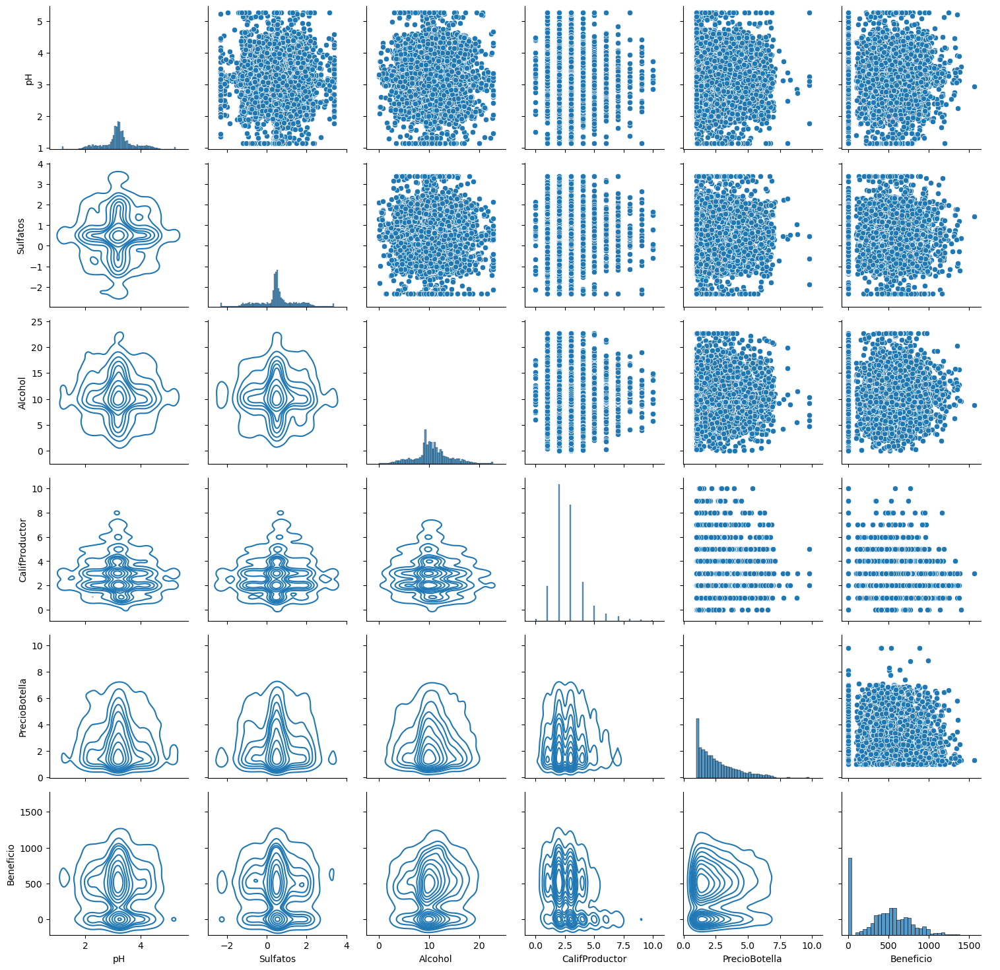

In [7]:
g = sns.PairGrid(vinosDep.iloc[:,6:])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()

## Variables de control

In [8]:
# Generar un par de variables de control para la evaluación de los efectos de los predictores frente a la respuesta
vinosDep['aleatorio'] = np.random.uniform(0,1,size=vinosDep.shape[0])
vinosDep['aleatorio2'] = np.random.uniform(0,1,size=vinosDep.shape[0])
vinosDep.head()

,ID,Acidez,AcidoCitrico,Azucar,CloruroSodico,Densidad,pH,Sulfatos,Alcohol,CalifProductor,PrecioBotella,Etiqueta,Clasificacion,Region,prop_missings,Beneficio,Compra,aleatorio,aleatorio2
0,2,0.16,-0.81,26.10,-0.425,1.02792,3.38,0.70,15.9,2,1.00,M,***,1.0,6.666667,515,1,0.999886,0.528681
1,4,2.64,-0.88,14.80,0.037,0.99518,3.12,0.48,22.0,3,3.38,M,***,3.0,0.000000,585,1,0.493619,0.431281
2,8,0.29,-0.40,21.50,0.060,0.99572,3.49,1.21,10.3,3,3.72,R,Desc,1.0,0.000000,0,0,0.740886,0.497947
3,11,-1.22,0.34,1.40,0.040,1.03236,3.20,0.34,11.6,2,6.23,B,***,2.0,6.666667,775,1,0.860194,0.334594
4,12,0.27,1.05,11.25,-0.007,0.99620,4.93,0.26,15.0,1,2.44,R,Desc,2.0,0.000000,596,1,0.629238,0.380535


## Obtener un reporte descriptivo del archivo completo

In [9]:
# Creamos el archivo vinosCompra 
vinosCompra = vinosDep.loc[vinosDep.Compra == 1].drop(['Compra'],axis=1).reset_index(drop=True)
vinosCompra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ID              4998 non-null   int64   
 1   Acidez          4998 non-null   float64 
 2   AcidoCitrico    4998 non-null   float64 
 3   Azucar          4998 non-null   float64 
 4   CloruroSodico   4998 non-null   float64 
 5   Densidad        4998 non-null   float64 
 6   pH              4998 non-null   float64 
 7   Sulfatos        4998 non-null   float64 
 8   Alcohol         4998 non-null   float64 
 9   CalifProductor  4998 non-null   int64   
 10  PrecioBotella   4998 non-null   float64 
 11  Etiqueta        4998 non-null   category
 12  Clasificacion   4998 non-null   category
 13  Region          4998 non-null   category
 14  prop_missings   4998 non-null   category
 15  Beneficio       4998 non-null   int64   
 16  aleatorio       4998 non-null   float64 
 17  aleatorio2    

In [10]:
# Importar ydata-profiling
import ydata_profiling

In [11]:
# Ver cuál es la versión
print(ydata_profiling.__version__)

v4.12.0


In [12]:
# Importar ProfileReport de ydata-profiling
from ydata_profiling import ProfileReport

In [13]:
# Muestra el resumen de la base vinosCompra
ProfileReport(vinosCompra)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Para el nuevo archivo, se vuelve a tener alta correlación de las variables Etiqueta y Clasificación con la variable objetivo, apareciendo algo coloreada la variable Alcohol

In [14]:
# Separar las respuestas y quedarnos con el input depurado
# Eliminar variable objetivo continua 
varObjCont = vinosCompra.Beneficio
imputCompra = vinosCompra.drop(['ID','Beneficio'],axis=1)
varObjCont.info()

<class 'pandas.core.series.Series'>
RangeIndex: 4998 entries, 0 to 4997
Series name: Beneficio
Non-Null Count  Dtype
--------------  -----
4998 non-null   int64
dtypes: int64(1)
memory usage: 39.2 KB


In [15]:
imputCompra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Acidez          4998 non-null   float64 
 1   AcidoCitrico    4998 non-null   float64 
 2   Azucar          4998 non-null   float64 
 3   CloruroSodico   4998 non-null   float64 
 4   Densidad        4998 non-null   float64 
 5   pH              4998 non-null   float64 
 6   Sulfatos        4998 non-null   float64 
 7   Alcohol         4998 non-null   float64 
 8   CalifProductor  4998 non-null   int64   
 9   PrecioBotella   4998 non-null   float64 
 10  Etiqueta        4998 non-null   category
 11  Clasificacion   4998 non-null   category
 12  Region          4998 non-null   category
 13  prop_missings   4998 non-null   category
 14  aleatorio       4998 non-null   float64 
 15  aleatorio2      4998 non-null   float64 
dtypes: category(4), float64(11), int64(1)
memory usage: 489.0 KB

## Ranking de efectos a priori por V de cramer

In [ ]:
# Se programa proceso de tal manera que si encuentra columnas numéricas las tramifique (en 5 tramos) y sino calcule el valor cramer que se extrae de la tabla de contingencia de los dos factores introducidos

In [16]:
# Librería estadística!
import scipy.stats as stats

# Función para calcular VCramer (dos nominales de entrada!)
def cramers_v(var1, varObj):
    
    if not var1.dtypes == 'category':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'category': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer


# Ejemplo uso univariante
#cramers_v(vinosCompra['Etiqueta'],vinosCompra['Beneficio'])

# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imputCompra.apply(lambda x: cramers_v(x,varObjCont)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al Beneficio').update_yaxes(categoryorder="total ascending")

## Exploración visual de relaciones

In [17]:
vinosCompra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   ID              4998 non-null   int64   
 1   Acidez          4998 non-null   float64 
 2   AcidoCitrico    4998 non-null   float64 
 3   Azucar          4998 non-null   float64 
 4   CloruroSodico   4998 non-null   float64 
 5   Densidad        4998 non-null   float64 
 6   pH              4998 non-null   float64 
 7   Sulfatos        4998 non-null   float64 
 8   Alcohol         4998 non-null   float64 
 9   CalifProductor  4998 non-null   int64   
 10  PrecioBotella   4998 non-null   float64 
 11  Etiqueta        4998 non-null   category
 12  Clasificacion   4998 non-null   category
 13  Region          4998 non-null   category
 14  prop_missings   4998 non-null   category
 15  Beneficio       4998 non-null   int64   
 16  aleatorio       4998 non-null   float64 
 17  aleatorio2    

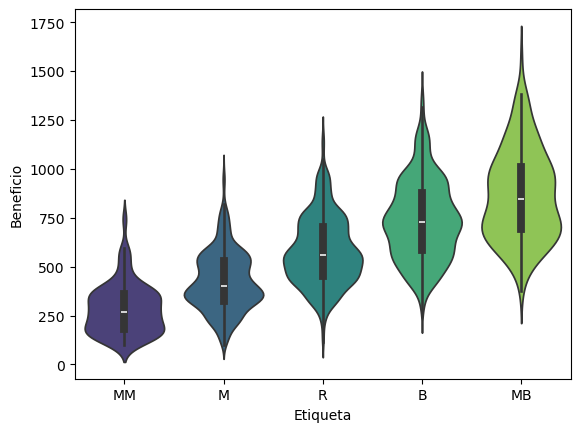

In [ ]:
# Cruce de Etiqueta con Beneficio en violinplot
sns.violinplot(data=vinosCompra, x="Etiqueta", y="Beneficio", hue="Etiqueta", palette="viridis",legend=False)
plt.show()

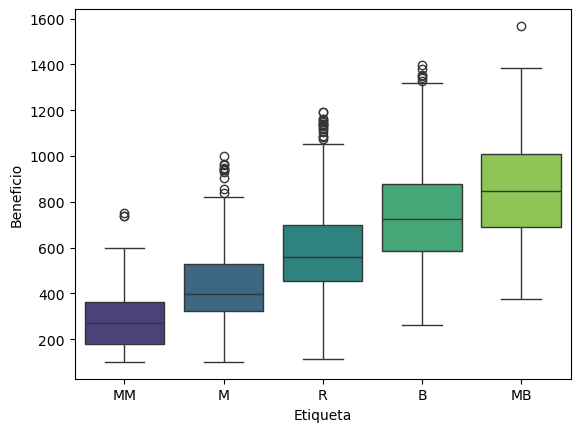

In [ ]:
# Cruce de Etiqueta con Beneficio en boxplot
sns.boxplot(data=vinosCompra, x="Etiqueta", y="Beneficio", hue="Etiqueta", palette="viridis",legend=False)
plt.show()

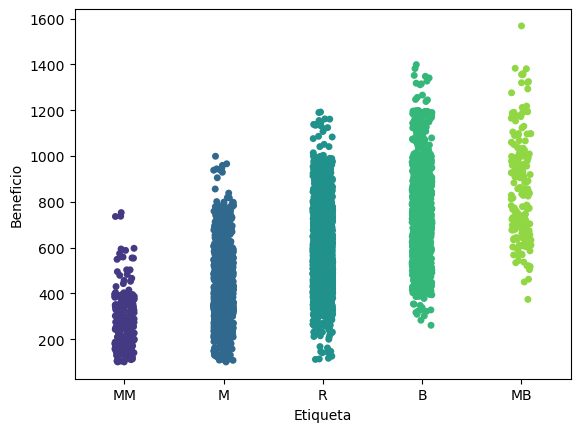

In [ ]:
# Cruce de Etiqueta con Beneficio en stripplot
sns.stripplot(data=vinosCompra, x="Etiqueta", y="Beneficio", hue="Etiqueta", palette="viridis",legend=False)
plt.show()

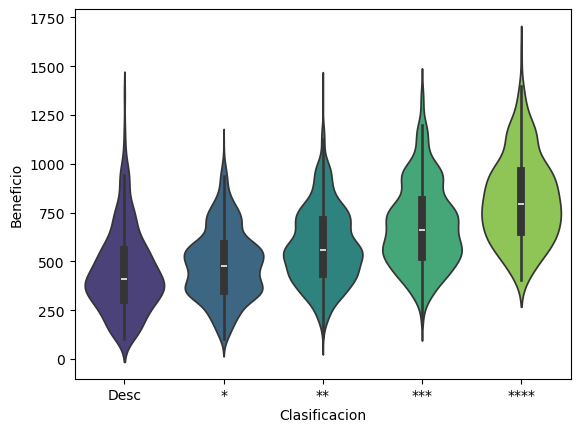

In [23]:
# Cruce de Clasificacion con Beneficio en violinplot
sns.violinplot(data=vinosCompra, x="Clasificacion", y="Beneficio", hue="Clasificacion", palette="viridis",legend=False)
plt.show()

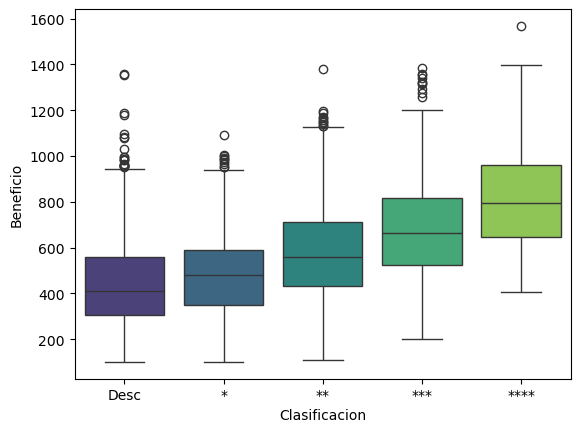

In [24]:
# Cruce de Clasificacion con Beneficio en boxplot
sns.boxplot(data=vinosCompra, x="Clasificacion", y="Beneficio", hue="Clasificacion", palette="viridis",legend=False)
plt.show()

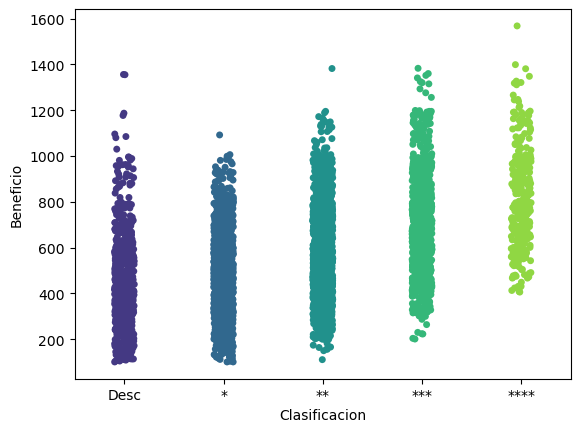

In [25]:
# Cruce de Clasificacion con Beneficio en stripplot
sns.stripplot(data=vinosCompra, x="Clasificacion", y="Beneficio", hue="Clasificacion", palette="viridis",legend=False)
plt.show()

## Transformaciones de las variables continuas

In [26]:
## Función mejor tranformación ##
from sklearn.preprocessing import scale

In [ ]:
# Busca la transformación de variables input de intervalo que maximiza la VCramer o la correlación tipo Pearson con la objetivo
def mejorTransf (vv,target, name=False, tipo = 'cramer', graf=False):
    
    # Escalado de datos (evitar fallos de tamaño de float64 al hacer exp de número grande..cosas de python)
    vv = pd.Series(scale(vv), name=vv.name)
    # Traslación a valores positivos de la variable (sino falla log y las raíces!)
    vv = vv + abs(min(vv))+0.0001
      
    # Definimos y calculamos las transformaciones típicas  
    transf = pd.DataFrame({vv.name + '_ident': vv, vv.name + '_log': np.log(vv), vv.name + '_exp': np.exp(vv), vv.name + '_sqrt': np.sqrt(vv), 
                         vv.name + '_sqr': np.square(vv), vv.name + '_cuarta': vv**4, vv.name + '_raiz4': vv**(1/4)})
      
    # Distinguimos caso cramer o caso correlación
    if tipo == 'cramer':
      # Aplicar la función cramers_v a cada transformación frente a la respuesta
      tablaCramer = pd.DataFrame(transf.apply(lambda x: cramers_v(x,target)),columns=['VCramer'])
      
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # Identificar mejor transformación
      best = tablaCramer.query('VCramer == VCramer.max()').index
      ser = transf[best[0]].squeeze()
    
    if tipo == 'cor':
      # Aplicar coeficiente de correlación a cada transformación frente a la respuesta
      tablaCorr = pd.DataFrame(transf.apply(lambda x: np.corrcoef(x,target)[0,1]),columns=['Corr'])
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCorr,x=tablaCorr.Corr,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # identificar mejor transformación
      best = tablaCorr.query('Corr.abs() == Corr.abs().max()').index
      ser = transf[best[0]].squeeze()
  
    # Aquí distingue si se devuelve la variable transformada o solamente el nombre de la transformación
    if name:
      return(ser.name)
    else:
      return(ser)

# Ejemplo de uso univariante
tr = mejorTransf(vinosCompra.Azucar,varObjCont, tipo='cor')

tr.head(),vinosCompra.Azucar.head()

(0    13.568871
 1    11.206764
 2     8.698218
 3    10.511281
 4     8.768504
 Name: Azucar_sqr, dtype: float64,
 0    26.10
 1    14.80
 2     1.40
 3    11.25
 4     1.80
 Name: Azucar, dtype: float64)

## Aplicación en modadilad correlación

In [28]:
# Aplicar a las variables continuas la mejor transformación según correlacion frente a varObjCont
transf_cor = imputCompra.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont, tipo='cor'))
# Pedir los nombres de las transformadas
transf_cor_names = imputCompra.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont,tipo='cor', name=True))
# Asignar nombres a las columnas de salida del proceso
transf_cor.columns = transf_cor_names.values
transf_cor.index

RangeIndex(start=0, stop=4998, step=1)

## Aplicación en modadilad V de Cramer

In [30]:
# Aplicar a las variables continuas la mejor transfromación según cramer frente a varObjCont
transf_cramer = imputCompra.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont, tipo='cramer'))
transf_cramer_names = imputCompra.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont,tipo='cramer', name=True))
transf_cramer.columns = transf_cramer_names.values

In [31]:
transf_cramer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Acidez_sqr            4998 non-null   float64
 1   AcidoCitrico_exp      4998 non-null   float64
 2   Azucar_exp            4998 non-null   float64
 3   CloruroSodico_cuarta  4998 non-null   float64
 4   Densidad_sqr          4998 non-null   float64
 5   pH_cuarta             4998 non-null   float64
 6   Sulfatos_exp          4998 non-null   float64
 7   Alcohol_sqr           4998 non-null   float64
 8   CalifProductor_raiz4  4998 non-null   float64
 9   PrecioBotella_exp     4998 non-null   float64
 10  aleatorio_exp         4998 non-null   float64
 11  aleatorio2_sqr        4998 non-null   float64
dtypes: float64(12)
memory usage: 468.7 KB


In [ ]:
##  Guardamos los archivos con las transformaciones para tenerlos a mano llegado el momento

In [38]:
# Input con transformadas según correlación y variable objetivo continua
todo_cont_cor = pd.concat([imputCompra,transf_cor,varObjCont], axis=1)
todo_cont_cor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Acidez               4998 non-null   float64 
 1   AcidoCitrico         4998 non-null   float64 
 2   Azucar               4998 non-null   float64 
 3   CloruroSodico        4998 non-null   float64 
 4   Densidad             4998 non-null   float64 
 5   pH                   4998 non-null   float64 
 6   Sulfatos             4998 non-null   float64 
 7   Alcohol              4998 non-null   float64 
 8   CalifProductor       4998 non-null   int64   
 9   PrecioBotella        4998 non-null   float64 
 10  Etiqueta             4998 non-null   category
 11  Clasificacion        4998 non-null   category
 12  Region               4998 non-null   category
 13  prop_missings        4998 non-null   category
 14  aleatorio            4998 non-null   float64 
 15  aleatorio2           

In [ ]:
# Guardar archivo
todo_cont_cor.to_csv('todo_cont_cor.csv')

In [39]:
# Input con transfromadas según cramer y variable objetivo continua
todo_cont_cramer= pd.concat([imputCompra,transf_cramer,varObjCont], axis=1)
todo_cont_cramer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4998 entries, 0 to 4997
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Acidez                4998 non-null   float64 
 1   AcidoCitrico          4998 non-null   float64 
 2   Azucar                4998 non-null   float64 
 3   CloruroSodico         4998 non-null   float64 
 4   Densidad              4998 non-null   float64 
 5   pH                    4998 non-null   float64 
 6   Sulfatos              4998 non-null   float64 
 7   Alcohol               4998 non-null   float64 
 8   CalifProductor        4998 non-null   int64   
 9   PrecioBotella         4998 non-null   float64 
 10  Etiqueta              4998 non-null   category
 11  Clasificacion         4998 non-null   category
 12  Region                4998 non-null   category
 13  prop_missings         4998 non-null   category
 14  aleatorio             4998 non-null   float64 
 15  alea

In [35]:
# Guardar archivo
todo_cont_cramer.to_csv('todo_cont_cramer.csv')

In [41]:
todo_cont_cor.dtypes

Acidez                  float64
AcidoCitrico            float64
Azucar                  float64
CloruroSodico           float64
Densidad                float64
pH                      float64
Sulfatos                float64
Alcohol                 float64
CalifProductor            int64
PrecioBotella           float64
Etiqueta               category
Clasificacion          category
Region                 category
prop_missings          category
aleatorio               float64
aleatorio2              float64
Acidez_sqr              float64
AcidoCitrico_exp        float64
Azucar_sqr              float64
CloruroSodico_sqr       float64
Densidad_raiz4          float64
pH_sqrt                 float64
Sulfatos_log            float64
Alcohol_sqrt            float64
CalifProductor_sqrt     float64
PrecioBotella_sqr       float64
aleatorio_sqrt          float64
aleatorio2_sqr          float64
Beneficio                 int64
dtype: object

In [ ]:
# Selecciona solo las columnas numéricas (int64 y float64)
todo_cont_cor_num = todo_cont_cor.select_dtypes(include=['float64', 'int64'])

# Calcula la matriz de correlación para las variables numéricas
corr = todo_cont_cor_num.corr()

# Visualiza la matriz de correlación con formato y un mapa de calor
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,Acidez,AcidoCitrico,Azucar,CloruroSodico,Densidad,pH,Sulfatos,Alcohol,CalifProductor,PrecioBotella,aleatorio,aleatorio2,Acidez_sqr,AcidoCitrico_exp,Azucar_sqr,CloruroSodico_sqr,Densidad_raiz4,pH_sqrt,Sulfatos_log,Alcohol_sqrt,CalifProductor_sqrt,PrecioBotella_sqr,aleatorio_sqrt,aleatorio2_sqr,Beneficio
Acidez,1.000,-0.023,-0.022,0.009,0.007,0.013,0.017,0.001,0.009,-0.002,0.003,-0.010,0.961,-0.014,-0.028,0.008,0.005,0.015,0.015,-0.001,0.005,-0.006,-0.001,-0.010,-0.044
AcidoCitrico,-0.023,1.000,0.015,-0.013,-0.014,-0.012,0.006,0.017,0.061,-0.013,0.001,0.012,-0.029,0.739,0.012,-0.012,-0.006,-0.011,-0.010,0.017,0.061,-0.015,-0.002,0.013,0.002
Azucar,-0.022,0.015,1.000,-0.001,0.012,0.004,-0.004,-0.021,-0.001,-0.018,-0.009,0.005,-0.023,0.009,0.959,-0.003,0.006,-0.000,-0.009,-0.023,0.005,-0.016,-0.008,0.005,-0.013
CloruroSodico,0.009,-0.013,-0.001,1.000,0.025,-0.013,-0.006,-0.014,0.010,-0.006,0.022,0.009,0.009,-0.013,-0.005,0.959,0.023,-0.015,0.015,-0.013,0.014,-0.004,0.021,0.009,-0.010
Densidad,0.007,-0.014,0.012,0.025,1.000,-0.014,-0.007,0.002,0.035,0.008,-0.029,-0.005,0.006,-0.011,0.008,0.028,0.859,-0.012,0.003,0.006,0.034,0.011,-0.032,-0.000,-0.015
pH,0.013,-0.012,0.004,-0.013,-0.014,1.000,0.007,-0.017,-0.082,-0.011,0.014,-0.025,0.013,0.015,0.004,-0.013,-0.013,0.966,0.009,-0.014,-0.087,-0.009,0.018,-0.029,0.017
Sulfatos,0.017,0.006,-0.004,-0.006,-0.007,0.007,1.000,0.004,0.017,0.002,0.021,0.009,0.015,-0.001,-0.007,-0.002,0.002,0.012,0.596,0.004,0.014,0.001,0.019,0.008,-0.005
Alcohol,0.001,0.017,-0.021,-0.014,0.002,-0.017,0.004,1.000,-0.027,0.009,-0.010,0.001,0.007,0.018,-0.023,-0.012,0.015,-0.021,0.010,0.985,-0.034,0.006,-0.011,-0.007,0.081
CalifProductor,0.009,0.061,-0.001,0.010,0.035,-0.082,0.017,-0.027,1.000,0.019,0.031,0.010,0.005,0.043,-0.003,0.009,0.025,-0.073,0.010,-0.025,0.973,0.025,0.032,0.014,-0.052
PrecioBotella,-0.002,-0.013,-0.018,-0.006,0.008,-0.011,0.002,0.009,0.019,1.000,-0.011,-0.009,-0.005,-0.018,-0.014,-0.011,0.000,-0.016,0.022,0.005,0.021,0.936,-0.010,-0.006,0.011


## Tramificación de variables continuas. Binning

In [ ]:
# Pasarlas a categóricas por tramos, como por ejemplo rangos de edades. Esto se puede haxe mediante árboles de regresión/clasificación

In [48]:
pip install optbinning

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires joblib~=1.1.0, but you have joblib 1.4.2 which is incompatible.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.7.6 which is incompatible.
streamlit 1.32.0 requires protobuf<5,>=3.20, but you have protobuf 5.26.1 which is incompatible.



   ---------------------------------------- 0.0/213.9 kB ? eta -:--:--
   ---------------------------------------- 213.9/213.9 kB 6.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/142.5 MB ? eta -:--:--
   ---------------------------------------- 1.2/142.5 MB 25.9 MB/s eta 0:00:06
    --------------------------------------- 2.9/142.5 MB 30.9 MB/s eta 0:00:05
   - -------------------------------------- 4.5/142.5 MB 31.5 MB/s eta 0:00:05
   - -------------------------------------- 5.8/142.5 MB 30.8 MB/s eta 0:00:05
   -- ------------------------------------- 7.2/142.5 MB 30.6 MB/s eta 0:00:05
   -- ------------------------------------- 7.5/142.5 MB 28.1 MB/s eta 0:00:05
   -- ------------------------------------- 8.8/142.5 MB 25.5 MB/s eta 0:00:06
   -- ------------------------------------- 10.1/142.5 MB 24.8 MB/s eta 0:00:06
   --- ------------------------------------ 11.3/142.5 MB 25.2 MB/s eta 0:00:06
   --- ------------------------------------ 12.2/142.5 MB 25.1 M

In [49]:
from optbinning import ContinuousOptimalBinning

optb = ContinuousOptimalBinning(name='Azucar', dtype="numerical", max_n_bins=3)
optb.fit(vinosCompra['Azucar'].values, varObjCont)

(CVXPY) Nov 27 02:16:04 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Nov 27 02:16:04 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')


ContinuousOptimalBinning(max_n_bins=3, name='Azucar')

In [50]:
# Incluir la variable directamente al dataset
x_transform_bins = optb.transform(vinosCompra['Azucar'].values, metric="bins")
x_transform_bins

array(['[12.05, inf)', '[12.05, inf)', '(-inf, 9.67)', ...,
       '(-inf, 9.67)', '[12.05, inf)', '[12.05, inf)'], dtype=object)

In [51]:
vinosCompra['Azucar_rec'] = x_transform_bins

<Axes: ylabel='Beneficio'>

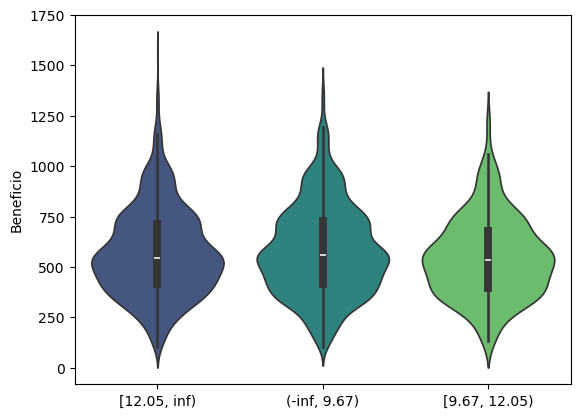

In [ ]:
sns.violinplot(x=x_transform_bins,y=varObjCont,palette='viridis',hue=x_transform_bins,legend=False)

In [ ]:
# Se observan ligerísimas diferencias en distribución que se consiguen en este caso tramificando la variable Azucar

# Modelos de regresión lineal para la predicción del beneficio del vino

In [ ]:
# En primer lugar, tomamos la partición training (donde ajustamos el modelo) y test (donde probamos su capacidad)

In [ ]:
# Se debe tener por separado la matriz de predictores y el vector de variable objetivo. Esto no es algo directo cuando existen variables categóricas en el dataset
# Se hace un paso previo de creación de variables dummy generando lo que se conoce como la matriz de diseño del modelo

In [ ]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Crear 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(imputCompra, varObjCont, test_size=0.2, random_state=42)

# Comprobar dimensiones de los train
print('Training dataset shape:', X_train.shape, y_train.shape)

Training dataset shape: (3998, 16) (3998,)


In [ ]:
# Comprobar dimensiones de los test
print('Testing dataset shape:', X_test.shape, y_test.shape)

Testing dataset shape: (1000, 16) (1000,)


In [ ]:
# Generar el training con la objetivo dentro 
data_train = X_train.join(y_train)

In [62]:
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajustar regresión de ejemplo
results = ols('Beneficio ~ Etiqueta + Acidez',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.370
Model:                            OLS   Adj. R-squared:                  0.370
Method:                 Least Squares   F-statistic:                     469.7
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        15:13:10   Log-Likelihood:                -26401.
No. Observations:                3998   AIC:                         5.281e+04
Df Residuals:                    3992   BIC:                         5.285e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        288.7395     13.962     20.680      0.000     261.366     316.113
Etiqueta[T.M]    138.7771     14.979      9.265      0.000     109.409     168.145
Etiqueta[T.R]    291.5566     14.522     20.076      0.000     263.085     320.029
Etiqueta[T.B]    452.0982     15.051     30.037      0.000     422.589     481.607
Etiqueta[T.MB]   585.2128     20.101     29.114      0.000     545.805     624.621
Acidez            -7.0908      3.680     -1.927      0.054     -14.305       0.123
==============================================================================
Omnibus:                      131.497   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              143.930
Skew:                           0.461   Prob(JB):                     5.57e-32
Kurtosis:                       3.122   Cond. No.                         13.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
# La variable categórica Etiqueta aparece con 5-1 = 4 efectos en el modelo (siendo el restante ‘MM’ recogido por la constante β0

## Modelo completo de referencia

In [ ]:
# Función para generar la fórmula por larga que sea
def ols_formula(df, dependent_var, *excluded_cols):
    df_columns = list(df.columns.values)
    df_columns.remove(dependent_var)
    for col in excluded_cols:
        df_columns.remove(col)
    return dependent_var + ' ~ ' + ' + '.join(df_columns)

# Aplicar a fórmula de modelo completo
form=ols_formula(data_train,'Beneficio')
form

'Beneficio ~ Acidez + AcidoCitrico + Azucar + CloruroSodico + Densidad + pH + Sulfatos + Alcohol + CalifProductor + PrecioBotella + Etiqueta + Clasificacion + Region + prop_missings + aleatorio + aleatorio2'

In [64]:
# Ajustar regresión según fórmula completa
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.434
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     121.9
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        15:37:45   Log-Likelihood:                -26188.
No. Observations:                3998   AIC:                         5.243e+04
Df Residuals:                    3972   BIC:                         5.259e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                             281.5547    108.059      2.606      0.009      69.698     493.411
Etiqueta[T.M]                         122.6962     14.336      8.558      0.000      94.589     150.803
Etiqueta[T.R]                         251.9089     14.084     17.887      0.000     224.297     279.521
Etiqueta[T.B]                         382.7345     14.838     25.795      0.000     353.644     411.825
Etiqueta[T.MB]                        495.1978     19.738     25.088      0.000     456.499     533.896
Clasificacion[T.*]                     18.3429      9.192      1.996      0.046       0.321      36.365
Clasificacion[T.**]                    63.5630      8.860      7.174      0.000      46.193      80.933
Clasificacion[T.***]                  127.7677      9.829     12.999      0.000     108.497     147.038
Clasificacion[T.****]                 205.7909     13.501     15.243      0.000     179.322     232.260
Region[T.2.0]                          11.3611      6.627      1.714      0.087      -1.632      24.354
Region[T.3.0]                           1.0795      6.568      0.164      0.869     -11.798      13.957
prop_missings[T.6.666666666666667]      2.9679      6.509      0.456      0.648      -9.793      15.729
prop_missings[T.13.333333333333334]    20.8628     17.241      1.210      0.226     -12.938      54.664
prop_missings[T.20.0]                 -47.6773     64.344     -0.741      0.459    -173.828      78.474
Acidez                                 -7.2448      3.505     -2.067      0.039     -14.116      -0.373
AcidoCitrico                           -1.8587      3.220     -0.577      0.564      -8.172       4.454
Azucar                                 -0.1281      0.079     -1.612      0.107      -0.284       0.028
CloruroSodico                          -7.4617      8.515     -0.876      0.381     -24.156       9.232
Densidad                              -57.3547    106.095     -0.541      0.589    -265.360     150.651
pH                                      3.5220      4.053      0.869      0.385      -4.424      11.468
Sulfatos                                1.1842      2.901      0.408      0.683      -4.504       6.872
Alcohol                                 4.2311      0.758      5.584      0.000       2.746       5.717
CalifProductor                         -6.3829      2.503     -2.551      0.011     -11.289      -1.477
PrecioBotella                          -0.3548      1.848     -0.192      0.848      -3.978       3.268
aleatorio                             -10.0390      9.338     -1.075      0.282     -28.347       8.269
aleatorio2                              0.1634      9.329      0.018      0.986     -18.127      18.454
===================================================================

In [ ]:
# El modelo completo bastante sobreparametrizado por lo que se ve, con muchos efectos no significativos cuya aportación al R2 será seguramente despreciable y puedan ser eliminados 

In [ ]:
# Filosofía matriz de diseño explícita
import statsmodels.api as sm
import patsy

# Generamos las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
model=sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.434
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     121.9
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        15:52:11   Log-Likelihood:                -26188.
No. Observations:                3998   AIC:                         5.243e+04
Df Residuals:                    3972   BIC:                         5.259e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                             281.5547    108.059      2.606      0.009      69.698     493.411
Etiqueta[T.M]                         122.6962     14.336      8.558      0.000      94.589     150.803
Etiqueta[T.R]                         251.9089     14.084     17.887      0.000     224.297     279.521
Etiqueta[T.B]                         382.7345     14.838     25.795      0.000     353.644     411.825
Etiqueta[T.MB]                        495.1978     19.738     25.088      0.000     456.499     533.896
Clasificacion[T.*]                     18.3429      9.192      1.996      0.046       0.321      36.365
Clasificacion[T.**]                    63.5630      8.860      7.174      0.000      46.193      80.933
Clasificacion[T.***]                  127.7677      9.829     12.999      0.000     108.497     147.038
Clasificacion[T.****]                 205.7909     13.501     15.243      0.000     179.322     232.260
Region[T.2.0]                          11.3611      6.627      1.714      0.087      -1.632      24.354
Region[T.3.0]                           1.0795      6.568      0.164      0.869     -11.798      13.957
prop_missings[T.6.666666666666667]      2.9679      6.509      0.456      0.648      -9.793      15.729
prop_missings[T.13.333333333333334]    20.8628     17.241      1.210      0.226     -12.938      54.664
prop_missings[T.20.0]                 -47.6773     64.344     -0.741      0.459    -173.828      78.474
Acidez                                 -7.2448      3.505     -2.067      0.039     -14.116      -0.373
AcidoCitrico                           -1.8587      3.220     -0.577      0.564      -8.172       4.454
Azucar                                 -0.1281      0.079     -1.612      0.107      -0.284       0.028
CloruroSodico                          -7.4617      8.515     -0.876      0.381     -24.156       9.232
Densidad                              -57.3547    106.095     -0.541      0.589    -265.360     150.651
pH                                      3.5220      4.053      0.869      0.385      -4.424      11.468
Sulfatos                                1.1842      2.901      0.408      0.683      -4.504       6.872
Alcohol                                 4.2311      0.758      5.584      0.000       2.746       5.717
CalifProductor                         -6.3829      2.503     -2.551      0.011     -11.289      -1.477
PrecioBotella                          -0.3548      1.848     -0.192      0.848      -3.978       3.268
aleatorio                             -10.0390      9.338     -1.075      0.282     -28.347       8.269
aleatorio2                              0.1634      9.329      0.018      0.986     -18.127      18.454
===================================================================

## Importancia de las variables en el modelo completo

In [69]:
pip install relativeImp

Note: you may need to restart the kernel to use updated packages.


In [70]:
from relativeImp import relativeImp

# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'Beneficio', driverNames = names)

# Ordenamos valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
2,Etiqueta[T.B],0.141724,32.641399
3,Etiqueta[T.MB],0.072857,16.780272
7,Clasificacion[T.****],0.058056,13.371282
0,Etiqueta[T.M],0.048239,11.110201
6,Clasificacion[T.***],0.046160,10.631478
1,Etiqueta[T.R],0.034867,8.030518
4,Clasificacion[T.*],0.014779,3.403938
5,Clasificacion[T.**],0.006764,1.557904
20,Alcohol,0.004998,1.151166
21,CalifProductor,0.001592,0.366564


In [ ]:
# Gráfico de importancia relativa en base al R2
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al r^2').update_yaxes(categoryorder="total ascending").show()

# Proceso backward para pruebas de modelos manuales

In [ ]:
# Se presenta solamente el final del recorrido por la eliminación de variables + evaluación del summary

In [72]:
# Proceso backward de eliminación de efectos según p-valor
form2=ols_formula(data_train,'Beneficio','prop_missings','aleatorio','aleatorio2',
                  'PrecioBotella','Sulfatos','AcidoCitrico','Densidad',
                  'CloruroSodico','pH','Region','Azucar')

# Ajusto regresión sin prop_missings
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.432
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     276.2
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        16:04:40   Log-Likelihood:                -26194.
No. Observations:                3998   AIC:                         5.241e+04
Df Residuals:                    3986   BIC:                         5.249e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept               233.6149     17.851     13.087      0.000     198.616     268.614
Etiqueta[T.M]           123.7002     14.303      8.649      0.000      95.659     151.741
Etiqueta[T.R]           252.7985     14.045     17.999      0.000     225.263     280.334
Etiqueta[T.B]           384.2551     14.799     25.964      0.000     355.240     413.270
Etiqueta[T.MB]          496.5073     19.697     25.207      0.000     457.890     535.124
Clasificacion[T.*]       18.1663      9.173      1.980      0.048       0.182      36.150
Clasificacion[T.**]      63.3873      8.840      7.170      0.000      46.056      80.719
Clasificacion[T.***]    127.2655      9.813     12.969      0.000     108.026     146.505
Clasificacion[T.****]   205.1645     13.489     15.210      0.000     178.719     231.610
Acidez                   -7.0448      3.497     -2.015      0.044     -13.900      -0.189
Alcohol                   4.3147      0.756      5.709      0.000       2.833       5.796
CalifProductor           -6.8862      2.481     -2.775      0.006     -11.751      -2.021
==============================================================================
Omnibus:                      112.956   Durbin-Watson:                   1.966
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              122.270
Skew:                           0.428   Prob(JB):                     2.81e-27
Kurtosis:                       3.016   Cond. No.                         136.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Evaluación en el conjunto de test

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo completo
vinos_y_pred = modeloC.predict(X_test)

# Cálculo de performance con MSE
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, vinos_y_pred)))

Mean squared error: 161.45


In [ ]:
# Cálculo coeficiente de determinación r^2
print("Coefficient of determination r^2: %.2f" % r2_score(y_test, vinos_y_pred))

Coefficient of determination: 0.44


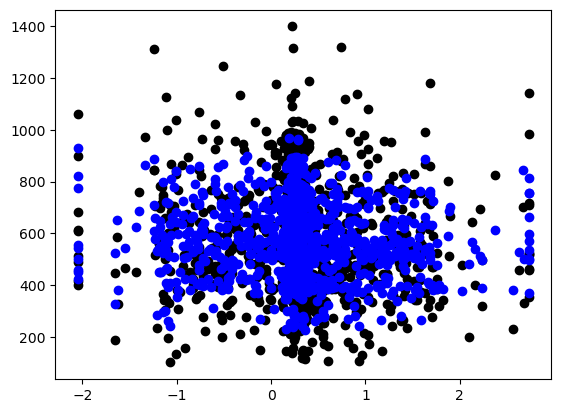

In [75]:
# Gráfico de real frente a prediccion para alguna variable
plt.scatter(X_test.Acidez, y_test, color="black")
plt.scatter(X_test.Acidez, vinos_y_pred, color="blue")

In [ ]:
# Para el modelo final backward, se tiene
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo C2
vinos_y_pred = modeloC2.predict(X_test)

# Cálculo de performance con MSE
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, vinos_y_pred)))

Mean squared error: 161.12


In [ ]:
# Cálculo coeficiente de determinación r^2
print("Coefficient of determination r^2: %.2f" % r2_score(y_test, vinos_y_pred))

Coefficient of determination: 0.44


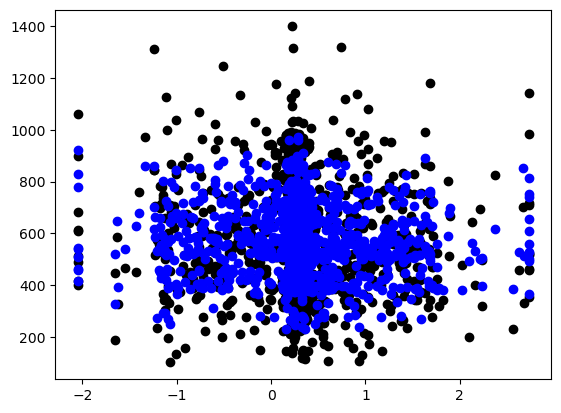

In [78]:
# Gráfico de real frente a prediccion para alguna variable
plt.scatter(X_test.Acidez, y_test, color="black")
plt.scatter(X_test.Acidez, vinos_y_pred, color="blue")

## Ajuste por validación cruzada repetida

In [ ]:
# Al utilizar sklearn, se obliga a considerar matrices explícitas de diseño.
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression

model = LinearRegression()
#model = sm.OLS(y,X)

# Establecer esquema de validación fijando random_state (reproducibilidad)
cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=12345)

# Obtener los resultados de r^2 para cada partición tr-tst
scores = cross_val_score(model, X, y, cv=cv)

# Sesgo y varianza
print('Coeficioente de detrminación r^2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficioente de detrminación R2: 0.424 (0.023)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\251153960.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: >

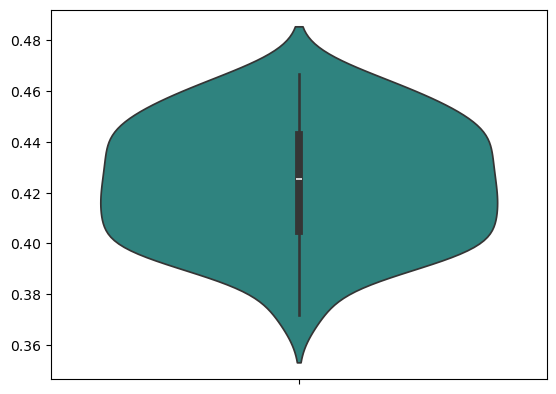

In [83]:
sns.violinplot(y=scores,palette='viridis')

## Modelo final backward

In [ ]:
# Generamos las matrices de diseño según la fórmula de modelo completo
y2, X2 = patsy.dmatrices(form2, vinosCompra, return_type='dataframe')

# Obtenemos los resultados de r^2 para cada partición tr-tst
scores = cross_val_score(model, X2, y2, cv=cv)

# Sesgo y varianza
print('Coeficioente de determinación r^2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficioente de determinación Modelo Final Backward: 0.430 (0.020)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\2710761148.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: >

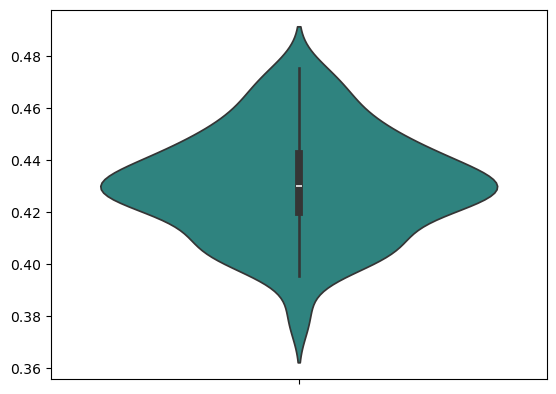

In [ ]:
# Gráfica del modelo final
sns.violinplot(y=scores,palette='viridis')

## Modelo con interacción Etiqueta-Clasificación

In [ ]:
form3 = 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta*Clasificacion'

# Ajustar regresión sin prop_missings
modeloC3 = ols(form3,data=data_train).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.435
Method:                 Least Squares   F-statistic:                     119.4
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        17:22:18   Log-Likelihood:                -26171.
No. Observations:                3998   AIC:                         5.240e+04
Df Residuals:                    3971   BIC:                         5.257e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
Intercept                              213.2052     25.448      8.378      0.000     163.313     263.098
Etiqueta[T.M]                          125.6758     25.972      4.839      0.000      74.755     176.596
Etiqueta[T.R]                          266.7446     26.061     10.235      0.000     215.650     317.839
Etiqueta[T.B]                          482.5666     33.017     14.616      0.000     417.835     547.298
Etiqueta[T.MB]                         697.2440     60.979     11.434      0.000     577.691     816.797
Clasificacion[T.*]                      52.1394     30.200      1.726      0.084      -7.070     111.349
Clasificacion[T.**]                     94.4485     40.012      2.361      0.018      16.003     172.894
Clasificacion[T.***]                    97.9298     60.996      1.606      0.108     -21.657     217.517
Clasificacion[T.****]                  124.4947     17.912      6.950      0.000      89.377     159.613
Etiqueta[T.M]:Clasificacion[T.*]       -12.3303     33.612     -0.367      0.714     -78.228      53.567
Etiqueta[T.R]:Clasificacion[T.*]       -25.7764     33.477     -0.770      0.441     -91.410      39.857
Etiqueta[T.B]:Clasificacion[T.*]      -147.8369     40.929     -3.612      0.000    -228.082     -67.592
Etiqueta[T.MB]:Clasificacion[T.*]     -116.6151     87.568     -1.332      0.183    -288.298      55.068
Etiqueta[T.M]:Clasificacion[T.**]      -16.2182     42.640     -0.380      0.704     -99.816      67.380
Etiqueta[T.R]:Clasificacion[T.**]      -21.6758     42.247     -0.513      0.608    -104.503      61.151
Etiqueta[T.B]:Clasificacion[T.**]     -115.1816     47.340     -2.433      0.015    -207.995     -22.368
Etiqueta[T.MB]:Clasificacion[T.**]    -227.5547     74.662     -3.048      0.002    -373.934     -81.175
Etiqueta[T.M]:Clasificacion[T.***]      71.5556     64.555      1.108      0.268     -55.009     198.120
Etiqueta[T.R]:Clasificacion[T.***]      24.7566     62.687      0.395      0.693     -98.145     147.658
Etiqueta[T.B]:Clasificacion[T.***]     -39.6734     66.122     -0.600      0.549    -169.309      89.963
Etiqueta[T.MB]:Clasificacion[T.***]   -163.3972     85.737     -1.906      0.057    -331.490       4.695
Etiqueta[T.M]:Clasificacion[T.****]    160.1078     44.298      3.614      0.000      73.259     246.957
Etiqueta[T.R]:Clasificacion[T.****]    102.0693     25.374      4.023      0.000      52.321     151.817
Etiqueta[T.B]:Clasificacion[T.****]     -2.9806     27.748     -0.107      0.914     -57.382      51.421
Etiqueta[T.MB]:Clasificacion[T.****]  -134.7019     52.138     -2.584      0.010    -236.922     -32.482
Acidez                                  -7.2777      3.496     -2.082      0.037     -14.131      -0.424
Alcohol                               

In [89]:
# Generar las matrices de diseño según la fórmula de modelo completo
y3, X3 = patsy.dmatrices(form3, vinosCompra, return_type='dataframe')

# Obtener los resultados de r^2 para cada partición tr-tst
scores = cross_val_score(model, X3, y3, cv=cv)

# Sesgo y varianza
print('Coeficioente de detrminación r^2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficioente de detrminación r^2 Modelo Final Backward: 0.431 (0.020)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\4268452045.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: >

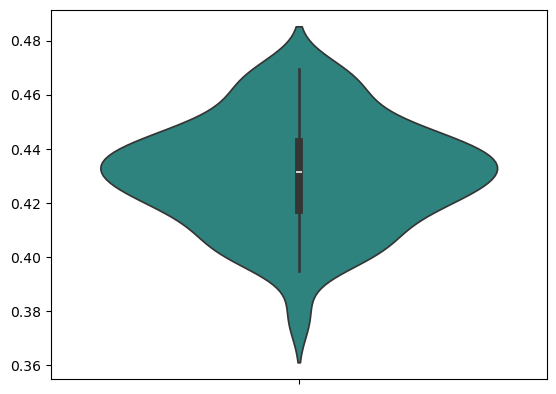

In [90]:
# Gráfica del modelo
sns.violinplot(y=scores,palette='viridis')

In [ ]:
# Actualizar el último modelo con esta unión de categorías

In [91]:
# Unir la categoría minoritaria MM con M en Etiqueta (archivo general)
vinosCompra['Etiqueta_r'] = vinosCompra.Etiqueta.replace(['M','MM'],'M-MM',inplace=False)

# Trasladar transformadas al inputCompra
imputCompra['Etiqueta_r'] = vinosCompra.Etiqueta_r
imputCompra['Azucar_rec'] = vinosCompra.Azucar_rec

# Crears 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(imputCompra, varObjCont, test_size=0.2, random_state=42)

# Generar el training con la objetivo dentro 
data_train_r = X_train.join(y_train)

form4 = 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta_r*Clasificacion'

# Generar las matrices de diseño según la fórmula de modelo completo
y4, X4 = patsy.dmatrices(form4, vinosCompra, return_type='dataframe')

# Obtener los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X4, y4, cv=cv)

# Sesgo y varianza
print('Coeficiente de detrminación r^2 Modelo Final Backward interacción Rec: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\3788338025.py:2: FutureWarning:

The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.



Coeficiente de detrminación r^2 Modelo Final Backward interacción Rec: 0.420 (0.019)


C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\251153960.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: >

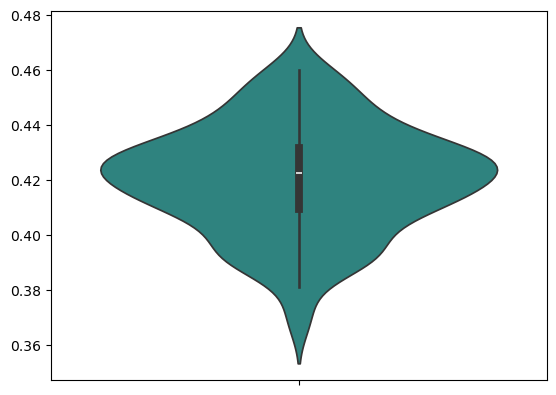

In [92]:
sns.violinplot(y=scores,palette='viridis')

## Comparación por validación cruzada. Función general

In [ ]:
# Seleccionar el mejor modelo en relación sesgo-varianza y complejidad

In [96]:
# Función para comparación por validación cruzada
def cross_val_lin(formula, data, seed=12345):
      # Generamos las matrices de diseño según la fórmula de modelo completo
      y, X = patsy.dmatrices(formula, data, return_type='dataframe')
      
      model = LinearRegression()
      
      # Establecemos esquema de validación fijando random_state (reproducibilidad)
      cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=seed)
  
      # Obtenemos los resultados de R2 para cada partición tr-tst
      scores = cross_val_score(model, X, y, cv=cv)
  
      # Sesgo y varianza
      print('Modelo: ' + formula)
      print('Coeficiente de determinación r^2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))
      
      #sns.violinplot(y=scores,palette='viridis')
      
      return(scores)

In [97]:
# Ejemplo de uso masivo para una lista de fórmulas distintas
form5 = 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta + Clasificacion + Azucar_rec'
form6 = 'Beneficio ~ Alcohol + CalifProductor + Etiqueta + Clasificacion'
form7 = 'Beneficio ~ CalifProductor + Etiqueta + Clasificacion + Azucar_rec'
form8 = 'Beneficio ~ Etiqueta + Clasificacion + Azucar_rec'


# Creamos lista de fórmulas   
list_form = [form,form2,form3,form4,form5,form6,form7,form8]
list_form

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)

['Beneficio ~ Acidez + AcidoCitrico + Azucar + CloruroSodico + Densidad + pH + Sulfatos + Alcohol + CalifProductor + PrecioBotella + Etiqueta + Clasificacion + Region + prop_missings + aleatorio + aleatorio2',
 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta + Clasificacion',
 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta*Clasificacion',
 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta_r*Clasificacion',
 'Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta + Clasificacion + Azucar_rec',
 'Beneficio ~ Alcohol + CalifProductor + Etiqueta + Clasificacion',
 'Beneficio ~ CalifProductor + Etiqueta + Clasificacion + Azucar_rec',
 'Beneficio ~ Etiqueta + Clasificacion + Azucar_rec']

In [98]:
list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,vinosCompra, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])

Modelo: Beneficio ~ Acidez + AcidoCitrico + Azucar + CloruroSodico + Densidad + pH + Sulfatos + Alcohol + CalifProductor + PrecioBotella + Etiqueta + Clasificacion + Region + prop_missings + aleatorio + aleatorio2
Coeficiente de determinación r^2: 0.428 (0.019)
Modelo: Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta + Clasificacion
Coeficiente de determinación r^2: 0.431 (0.018)
Modelo: Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta*Clasificacion
Coeficiente de determinación r^2: 0.431 (0.019)
Modelo: Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta_r*Clasificacion
Coeficiente de determinación r^2: 0.421 (0.019)
Modelo: Beneficio ~ Acidez + Alcohol + CalifProductor + Etiqueta + Clasificacion + Azucar_rec
Coeficiente de determinación r^2: 0.431 (0.018)
Modelo: Beneficio ~ Alcohol + CalifProductor + Etiqueta + Clasificacion
Coeficiente de determinación r^2: 0.430 (0.018)
Modelo: Beneficio ~ CalifProductor + Etiqueta + Clasificacion + Azucar_rec
Coeficiente de d

In [102]:
# Ver los r^2
results = list_res.T.melt()
results.columns = ['Modelo','r^2']
results.head()

,Modelo,r^2
0,0,0.396705
1,0,0.455067
2,0,0.387646
3,0,0.427140
4,0,0.456419


In [103]:
results.tail()

,Modelo,r^2
795,7,0.410597
796,7,0.438855
797,7,0.438159
798,7,0.393291
799,7,0.440769


In [ ]:
# Juntar los resultados de los “resamples” en un dataset para generar el gráfico de boxplots de las distribuciones de r^2 a través de los modelos y valorar la relación sesgo-varianza

<Axes: xlabel='Modelo', ylabel='r^2'>

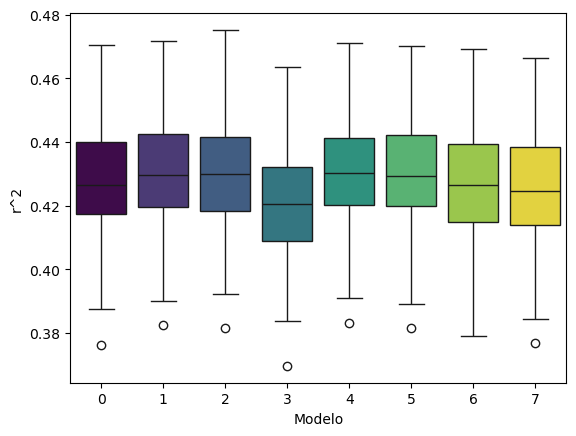

In [105]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='r^2',data=results,palette='viridis',hue='Modelo',legend=False)

In [ ]:
# Todo indica que el mejor modelo en todos los sentidos es el modelo final backward sin interacción.Se elige el indicado como 1 que es el modelo de fórmula form2

## Ajuste del modelo final. Interpretación de parámetros

In [106]:
# Ajusto regresión sin prop_missings
modelo_final = ols(form2,data=vinosCompra).fit()
modelo_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              Beneficio   R-squared:                       0.435
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     348.5
Date:                Wed, 27 Nov 2024   Prob (F-statistic):               0.00
Time:                        17:55:07   Log-Likelihood:                -32696.
No. Observations:                4998   AIC:                         6.542e+04
Df Residuals:                    4986   BIC:                         6.549e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept               237.0069     15.809     14.992      0.000     206.014     268.000
Etiqueta[T.M]           123.4683     12.657      9.755      0.000      98.656     148.281
Etiqueta[T.R]           255.8183     12.431     20.579      0.000     231.448     280.188
Etiqueta[T.B]           385.1362     13.117     29.362      0.000     359.421     410.851
Etiqueta[T.MB]          495.0646     17.663     28.028      0.000     460.437     529.692
Clasificacion[T.*]       20.8049      8.105      2.567      0.010       4.915      36.695
Clasificacion[T.**]      66.9605      7.827      8.555      0.000      51.616      82.305
Clasificacion[T.***]    125.0136      8.657     14.440      0.000     108.041     141.986
Clasificacion[T.****]   208.9569     11.969     17.459      0.000     185.493     232.421
Acidez                   -7.4653      3.102     -2.406      0.016     -13.547      -1.383
Alcohol                   4.1707      0.673      6.200      0.000       2.852       5.489
CalifProductor           -8.4690      2.216     -3.822      0.000     -12.813      -4.125
==============================================================================
Omnibus:                      131.641   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              141.746
Skew:                           0.412   Prob(JB):                     1.66e-31
Kurtosis:                       3.044   Cond. No.                         136.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Conclusiones que podemos sacar para aquellos vinos con Compra = 1, es decir beneficio distinto de 0:

1. Los vinos con Clasificación 4 estrellas tienen un beneficio estimado medio 208.67 unidades superior* a los vinos de clasificación Desconocida. El rango de variación esperado es [186.126, 233.065].

2. El beneficio estimado medio de los vinos de Clasificación 1 estrella es 21.22 unidades superior* al de los vinos con Clasificación Deconocida. El rango de variación esperado es [5.322, 37.112].

3. El beneficio estimado medio de los vinos de Etiqueta MB, es 494.51 unidades mayor que el de los vinos con etiqueta MM. El rango de variación esperado es [459.863, 529.148].

4. El aumento unitario de la Calificación del Productor, produce una disminución del beneficio estimado del vino de 8.52 unidades. Puede resultar sorprendente pero hay que tener en cuenta que la variación es a un nivel marginal, con lo cual se valora qué pasa con el aumento unitario de la calificación del propio productor para vinos con la misma clasificación, etiqueta y niveles de alcohol y acidez.

5. El aumento unitario en el nivel de Acidez produce una *disminución del Beneficio esperado de 7.42 unidades**

6. El aumento unitario en el nivel de Alcohol produce un *aumento del Beneficio esperado de 3.89 unidades**

# Anexo: Posibilidades estadísticas para evaluación de relaciones

## * Caso categórica-categórica. Chi cuadrado

In [107]:
# Opción para calcular las medias de Beneficio en los cruces de Clasificación y Etiqueta
pd.pivot_table(vinosCompra,index =['Etiqueta'],columns=['Clasificacion'],values=['Beneficio'],aggfunc=[np.mean])

# Tabla de contingencia con la cuenta de frecuencia de observaciones en cada cruce

C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\268549880.py:2: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior

C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\268549880.py:2: FutureWarning:

The provided callable <function mean at 0x0000025BC69D8860> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



mean                                                
                Beneficio                                                
Clasificacion        Desc           *          **         ***        ****
Etiqueta                                                                 
MM             227.714286  292.464646  349.676471  352.909091         NaN
M              365.428571  403.221445  449.474178  523.120968  635.846154
R              507.620553  536.413989  581.393564  636.366733  725.234694
B              706.515625  635.623457  701.191919  775.459016  857.936416
MB             900.750000  830.000000  826.568182  857.851351  929.973684

In [108]:
pd.crosstab(vinosCompra.Etiqueta,vinosCompra.Clasificacion)

Clasificacion,Desc,*,**,***,****
Etiqueta,,,,,
MM,63,99,34,11,0
M,273,429,426,124,13
R,253,529,808,499,98
B,64,162,396,366,173
MB,12,10,44,74,38


In [ ]:
# Probar el test chi cuadrado para ver las salidas
stats.chi2_contingency(pd.crosstab(vinosCompra.Etiqueta,vinosCompra.Clasificacion).values)

Chi2ContingencyResult(statistic=842.5114902984811, pvalue=5.340776470642584e-169, dof=16, expected_freq=array([[ 27.54201681,  50.90096038,  70.7394958 ,  44.48139256,
         13.33613445],
       [168.31232493, 311.06142457, 432.29691877, 271.83073229,
         81.49859944],
       [290.98739496, 537.77971188, 747.37815126, 469.95558223,
        140.89915966],
       [154.47478992, 285.4879952 , 396.75630252, 249.48259304,
         74.79831933],
       [ 23.68347339,  43.76990796,  60.82913165,  38.24969988,
         11.46778711]]))

In [111]:
# Primer valor: Valor del estadístico Chi-cuadrado
# Segundo valor: p-valor del contraste de hipótesis (recordemos H0: no existe asociación)
# Tercer valor: Grados de libertad de la distribución de contraste (filas-1)*(columnas-1)
# Cuarto valor: Matriz de valores esperados bajo H0 (según las distribuciones marginales de las variables, cuan probable es encontrar casilla 1,1… p(x=1)*p(y=1)

#### El valor de chi es muy alto, por lo que el p-valor es muy pequeño, prácticamente 0. Por lo que se evidencia una asociación significativa entre estas dos variables, o bien, la matriz de valores observados es significativamente distinta a la matriz de valores esperados bajo independencia.

## * Caso categorica-numérica mediante ANOVA

In [ ]:
# Obtener la tabla ANOVA como salida similar a R
import statsmodels.api as sm
from statsmodels.formula.api import ols

# ANOVA región
model = ols('Beneficio ~ C(Region)', data=vinosCompra).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Region),2.010781e+05,2.0,2.018968,0.132901
Residual,2.487373e+08,4995.0,NaN,NaN


In [ ]:
# Para la variable Región: Se observa que el p-valor es superior a 0,05 por lo que la asociación no es significativa al 95% de nivel de confianza. Esta variable no influye mucho en el Beneficio

In [113]:
# ANOVA Etiqueta
model = ols('Beneficio ~ C(Etiqueta)', data=vinosCompra).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Etiqueta),9.240747e+07,4.0,736.899964,0.0
Residual,1.565309e+08,4993.0,NaN,NaN


In [ ]:
# Para la variable Etiqueta: Se observa que el p-valor es 0 por lo que la asociación es significativa a cualquier nivel de confianza. Esta variable influye mucho en el Beneficio

In [114]:
# ANOVA dedoble vía, con dos factores e interacción
model = ols('Beneficio ~ C(Etiqueta) + C(Clasificacion) + C(Etiqueta):C(Clasificacion)', data=vinosCompra).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

c:\Users\Usuario\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 4, but rank is 3



,sum_sq,df,F,PR(>F)
C(Etiqueta),7.500830e+07,4.0,659.687718,0.000000e+00
C(Clasificacion),6.634407e+06,4.0,58.348695,4.584678e-37
C(Etiqueta):C(Clasificacion),1.016574e+07,16.0,22.351569,7.635523e-64
Residual,1.413894e+08,4974.0,NaN,NaN


In [ ]:
# Se ve que existe influencia marginal de ambos factores sobre Beneficio pero también una influencia conjunta de ambos! Así, el beneficio esperado puede depender de combinación de Clasificación y Etiqueta del vino

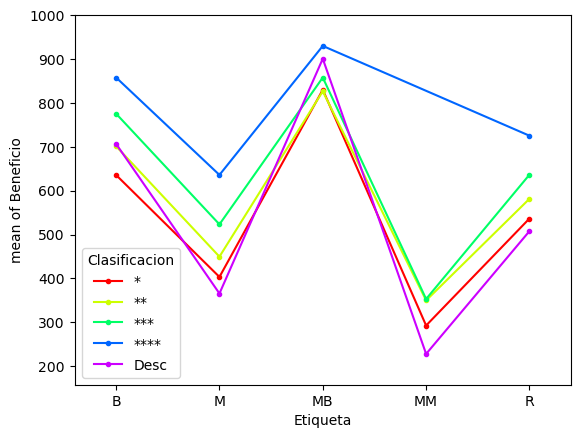

In [ ]:
# Gráfico de interacciones entre dos factores y la variable continua
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt


# Gráfico de interacción de las componentes del ANOVA
fig = interaction_plot(x=vinosCompra.Etiqueta.astype('object'), trace=vinosCompra['Clasificacion'].astype('object'), response=vinosCompra['Beneficio'])
plt.show() # Se evidencia interacción entre los factores cuando las líneas se cortan en algún punto

In [116]:
# Unir la categoría minoritaria MM con M en Etiqueta
vinosCompra['Etiqueta_r'] = vinosCompra.Etiqueta.replace(['M','MM'],'M-MM',inplace=False)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_25068\2208518038.py:2: FutureWarning:

The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.



In [117]:
pd.crosstab(vinosCompra.Etiqueta_r,vinosCompra.Clasificacion)

Clasificacion,Desc,*,**,***,****
Etiqueta_r,,,,,
M-MM,336,528,460,135,13
R,253,529,808,499,98
B,64,162,396,366,173
MB,12,10,44,74,38


In [118]:
# Probar el test chi cuadrado para ver las salidas
stats.chi2_contingency(pd.crosstab(vinosCompra.Etiqueta_r,vinosCompra.Clasificacion).values)

Chi2ContingencyResult(statistic=800.5770302943753, pvalue=1.244618385605778e-163, dof=12, expected_freq=array([[195.85434174, 361.96238495, 503.03641457, 316.31212485,
         94.83473389],
       [290.98739496, 537.77971188, 747.37815126, 469.95558223,
        140.89915966],
       [154.47478992, 285.4879952 , 396.75630252, 249.48259304,
         74.79831933],
       [ 23.68347339,  43.76990796,  60.82913165,  38.24969988,
         11.46778711]]))

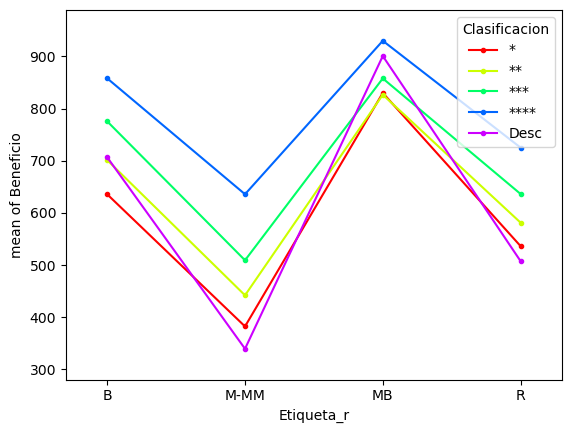

In [ ]:
# Gráfico de interacción de las componentes del ANOVA
fig = interaction_plot(x=vinosCompra.Etiqueta_r.astype('object'), trace=vinosCompra['Clasificacion'].astype('object'), response=vinosCompra['Beneficio'])
plt.show() # Sigue evidenciándose interacción entre los factores, especialmente en la categoría desconocido